In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("jangedoo/utkface-new")

print("Path to dataset files:", path)

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
from torch.utils.data import DataLoader, Dataset

In [2]:
images = os.listdir('/kaggle/input/utkface-new/UTKFace')
images_crop = os.listdir('/kaggle/input/utkface-new/crop_part1')

In [3]:
ages = []
for filename in images_crop:
    age = int(filename.split('_')[0])
    ages.append(age)
age_category = []
for age in ages:
    if age <= 3:
        age_category.append(0)
    elif 4 <= age <= 10:
        age_category.append(1)
    elif 11 <= age <= 15:
        age_category.append(2)
    elif 16 <= age <= 20:
        age_category.append(3)
    elif 21 <= age <= 27:
        age_category.append(4)
    elif 28 <= age <= 34:
        age_category.append(5)
    elif 35 <= age <= 43:
        age_category.append(6)
    elif 44 <= age <= 53:
        age_category.append(7)
    elif 54 <= age <= 62:
        age_category.append(8)
    elif 63 <= age <= 74:
        age_category.append(9)
    else:
        age_category.append(10)
ages = np.array(ages)
age_category = np.array(age_category)

Minimum age: 1
Maximum age: 110


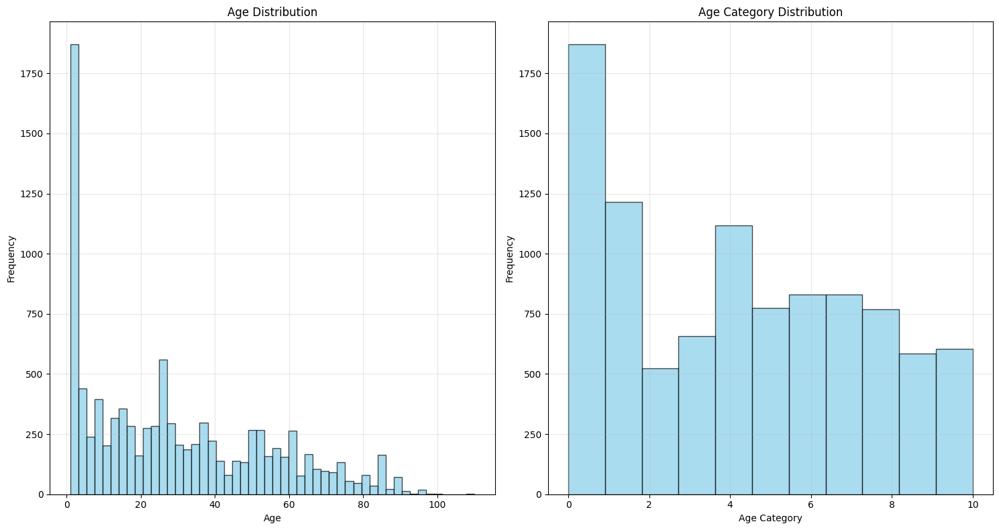

In [4]:
print(f"Minimum age: {ages.min()}")
print(f"Maximum age: {ages.max()}")

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.hist(ages, bins=50, edgecolor='black', alpha=0.7, color='skyblue')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age Distribution')
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.hist(age_category, bins=11, edgecolor='black', alpha=0.7, color='skyblue')
plt.xlabel('Age Category')
plt.ylabel('Frequency')
plt.title('Age Category Distribution')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [5]:
for i, im in enumerate(images_crop):
  images_crop[i] = f"crop_part1/{im}"

In [6]:
cat1 = 200
cat2 = 300
cat3 = 400
cat4 = 700
cat5 = 1100
cat6 = 1000
cat7 = 1000
cat8 = 1050
cat9 = 1000
cat10 = 800
for i, im in enumerate(images):
  age = int(im.split('_')[0])
  if 4 <= age <= 10:
      if cat1 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat1 -= 1
  elif 11 <= age <= 15:
      if cat2 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat2 -= 1
  elif 16 <= age <= 20:
      if cat3 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat3 -= 1
  elif 21 <= age <= 27:
      if cat4 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat4 -= 1
  elif 28 <= age <= 34:
      if cat5 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat5 -= 1
  elif 35 <= age <= 43:
      if cat6 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat6 -= 1
  elif 44 <= age <= 53:
      if cat7 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat7 -= 1
  elif 54 <= age <= 62:
      if cat8 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat8 -= 1
  elif 63 <= age <= 74:
      if cat9 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat9 -= 1
  else:
      if cat10 > 0:
        images_crop.append(f"UTKFace/{im}")
        cat10 -= 1

In [7]:
ages = []
for filename in images_crop:
    age = int(filename.split('/')[1].split('_')[0])
    ages.append(age)
age_category = []
for age in ages:
    if age <= 3:
        age_category.append(0)
    elif 4 <= age <= 10:
        age_category.append(1)
    elif 11 <= age <= 15:
        age_category.append(2)
    elif 16 <= age <= 20:
        age_category.append(3)
    elif 21 <= age <= 27:
        age_category.append(4)
    elif 28 <= age <= 34:
        age_category.append(5)
    elif 35 <= age <= 43:
        age_category.append(6)
    elif 44 <= age <= 53:
        age_category.append(7)
    elif 54 <= age <= 62:
        age_category.append(8)
    elif 63 <= age <= 74:
        age_category.append(9)
    else:
        age_category.append(10)
ages = np.array(ages)
age_category = np.array(age_category)

Minimum age: 1
Maximum age: 116


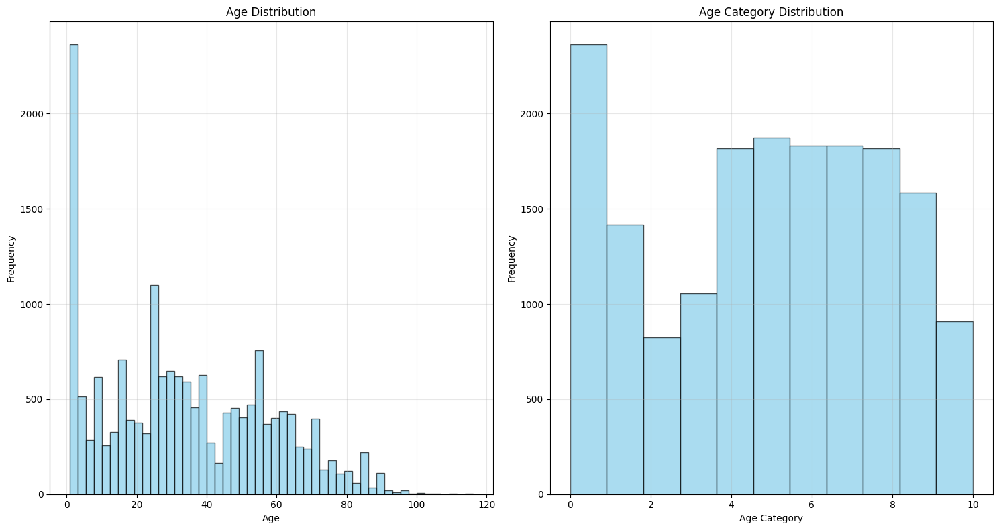

In [8]:
print(f"Minimum age: {ages.min()}")
print(f"Maximum age: {ages.max()}")

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.hist(ages, bins=50, edgecolor='black', alpha=0.7, color='skyblue')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age Distribution')
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.hist(age_category, bins=11, edgecolor='black', alpha=0.7, color='skyblue')
plt.xlabel('Age Category')
plt.ylabel('Frequency')
plt.title('Age Category Distribution')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [9]:
class ImageDataset(Dataset):
    def __init__(self, root_dir, image_files, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = image_files

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.image_files[idx])
        image = Image.open(img_name)

        filename = self.image_files[idx]
        age = int(filename.split('/')[1].split('_')[0])
        if age <= 3:
            age = 0
        elif 4 <= age <= 10:
            age = 1
        elif 11 <= age <= 15:
            age = 2
        elif 16 <= age <= 20:
            age = 3
        elif 21 <= age <= 27:
            age = 4
        elif 28 <= age <= 34:
            age = 5
        elif 35 <= age <= 43:
            age = 6
        elif 44 <= age <= 53:
            age = 7
        elif 54 <= age <= 62:
            age = 8
        elif 63 <= age <= 74:
            age = 9
        else:
            age = 10

        if self.transform:
            image = self.transform(image)

        return {'image': image, 'age':age}

In [10]:

transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=8),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    transforms.ToTensor(),
    transforms.Normalize([0.5 for _ in range(3)], [0.5 for _ in range(3)]),
])

dataset = ImageDataset("/kaggle/input/utkface-new/", images_crop, transform=transform)
batch_size = 32
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [11]:
img_rows = 128
img_cols = 128
channels = 3
img_shape = (channels, img_rows, img_cols)
z_dim = 128

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_gpus = torch.cuda.device_count()

In [13]:
class AgeEmbedding(nn.Module):
    def __init__(self):
        super(AgeEmbedding, self).__init__()
        self.age_emb = nn.Embedding(num_embeddings=11, embedding_dim=5)

    def forward(self, x):
        return self.age_emb(x)

In [14]:
class GenBlock(nn.Module):
    def __init__(self, inCh, outCh, add_conv):
        super(GenBlock, self).__init__()

        layers = [
            nn.ConvTranspose2d(inCh, outCh, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(outCh),
            nn.SiLU(True),
        ]

        if add_conv:
            layers.extend([
                nn.Conv2d(outCh, outCh, kernel_size=3, stride=1, padding=1, bias=False),
                nn.BatchNorm2d(outCh),
                nn.SiLU(True),
            ])

        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)

In [15]:
class Generator(nn.Module):
  def __init__(self, z_dim, age_embedding):
    super(Generator, self).__init__()
    self.age_embedding = age_embedding

    self.model = nn.Sequential(
        nn.Linear(z_dim + 5, 4 * 4 * 128),
        nn.LeakyReLU(0.2),

        nn.Unflatten(1, (128, 4, 4)),

        GenBlock(128, 256, False),
        GenBlock(256, 128, False),
        GenBlock(128, 64, True),
        GenBlock(64, 32, True),

        nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1),
        nn.Tanh(),

    )
  def forward(self, z, age):
    age_emb = self.age_embedding(age)
    img = self.model(torch.cat([z, age_emb], dim=1))
    return img

In [16]:
class DisBlock(nn.Module):
    def __init__(self, inCh, outCh, add_conv):
        super(DisBlock, self).__init__()

        layers = [
            nn.utils.spectral_norm(nn.Conv2d(inCh, outCh, kernel_size=4, stride=2, padding=1, bias=False)),
            nn.LeakyReLU(0.2),
        ]

        if add_conv:
            layers.extend([
                nn.utils.spectral_norm(nn.Conv2d(outCh, outCh, kernel_size=3, stride=1, padding=1, bias=False)),
                nn.LeakyReLU(0.2),
            ])

        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)

In [17]:
class ExpandLabelInput(nn.Module):
    def __init__(self, target_height, target_width):
        super(ExpandLabelInput, self).__init__()
        self.target_height = target_height
        self.target_width = target_width
    def forward(self, x):
        x = x.unsqueeze(2).unsqueeze(3)
        x = x.expand(-1, -1, self.target_height, self.target_width)
        return x

In [18]:
class Discriminator(nn.Module):
    def __init__(self, age_embedding):
        super(Discriminator, self).__init__()

        self.age_embedding = age_embedding
        self.model1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            nn.Dropout2d(0.2),
        )
        self.model2 = nn.Sequential(
            DisBlock(32 + 5, 64, True),
            DisBlock(64, 128, True),
            DisBlock(128, 256, False),
            DisBlock(256, 128, False), #4*4
            nn.Conv2d(128, 1, kernel_size=4, stride=2, padding=0),
            nn.Sigmoid(),
        )

    def forward(self, img, age):
        validity = self.model1(img)
        expand_layer = ExpandLabelInput(target_height=64, target_width=64)
        age_emb = self.age_embedding(age)
        label_output = expand_layer(age_emb)
        validity = self.model2(torch.cat([validity, label_output], dim=1))
        return validity

In [19]:
age_embedding = AgeEmbedding().to(device)
generator = Generator(z_dim, age_embedding).to(device)
discriminator = Discriminator(age_embedding).to(device)
if num_gpus > 1:
    generator = nn.DataParallel(generator)
    discriminator = nn.DataParallel(discriminator)

optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

adversarial_loss = nn.BCELoss()

In [20]:
from torchinfo import summary

print("=== GENERATOR DETAILED SUMMARY ===")
summary(
    generator,
    input_size=[(1, z_dim), (1,)], 
    dtypes=[torch.float32, torch.long],
    device=device,
    col_names=["input_size", "output_size", "num_params", "kernel_size", "mult_adds"],
    verbose=1
)

print("\n=== DISCRIMINATOR DETAILED SUMMARY ===")
summary(
    discriminator,
    input_size=[(1, 3, 128, 128), (1,)], 
    dtypes=[torch.float32, torch.long],
    device=device,
    col_names=["input_size", "output_size", "num_params", "kernel_size", "mult_adds"],
    verbose=1
)

=== GENERATOR DETAILED SUMMARY ===
Layer (type:depth-idx)                        Input Shape               Output Shape              Param #                   Kernel Shape              Mult-Adds
Generator                                     [1, 128]                  [1, 3, 128, 128]          --                        --                        --
├─AgeEmbedding: 1-1                           [1]                       [1, 5]                    --                        --                        --
│    └─Embedding: 2-1                         [1]                       [1, 5]                    55                        --                        55
├─Sequential: 1-2                             [1, 133]                  [1, 3, 128, 128]          --                        --                        --
│    └─Linear: 2-2                            [1, 133]                  [1, 2048]                 274,432                   --                        274,432
│    └─LeakyReLU: 2-3              

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Kernel Shape              Mult-Adds
Discriminator                            [1, 3, 128, 128]          [1, 1, 1, 1]              --                        --                        --
├─Sequential: 1-1                        [1, 3, 128, 128]          [1, 32, 64, 64]           --                        --                        --
│    └─Conv2d: 2-1                       [1, 3, 128, 128]          [1, 32, 64, 64]           1,568                     [4, 4]                    6,422,528
│    └─LeakyReLU: 2-2                    [1, 32, 64, 64]           [1, 32, 64, 64]           --                        --                        --
│    └─Dropout2d: 2-3                    [1, 32, 64, 64]           [1, 32, 64, 64]           --                        --                        --
├─AgeEmbedding: 1-2                      [1]                       [1, 5]                    --   

In [ ]:
# Fonction pour échantillonner des images générées
def sample_images(generator, grid_rows=2, grid_cols=2):
    z = torch.randn(grid_rows * grid_cols, z_dim).to(device)

    age_cate = torch.randint(0, 11, (grid_rows * grid_cols,)).to(device) 
    
    gen_imgs = generator(z, age_cate).detach().cpu()
    gen_imgs = 0.5 * gen_imgs + 0.5
    print(gen_imgs[0].shape)

    fig, axs = plt.subplots(grid_rows, grid_cols, figsize=(4, 4), sharey=True, sharex=True)
    cnt = 0
    for i in range(grid_rows):
        for j in range(grid_cols):
         
            axs[i, j].imshow(gen_imgs[cnt].permute(1, 2, 0)) 
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

# Entraînement du GAN
def train2(epochs):
    generator.train()
    discriminator.train()
    
    for epoch in range(epochs):
        for i, batch in enumerate(dataloader):
            current_batch_size = batch['image'].size(0)
            
            # Labels réels et faux avec label smoothing
            real_labels = torch.full((current_batch_size, 1, 1, 1), 0.8, device=device)
            fake_labels = torch.full((current_batch_size, 1, 1, 1), 0.1, device=device)
            
            # Données réelles
            real_imgs = batch['image'].to(device)
            real_imgs = real_imgs + 0.01 * torch.randn_like(real_imgs)
            real_ages = batch['age'].long().to(device)
            
            #  Entraînement du Discriminateur 
            optimizer_D.zero_grad()
            
            # Forward sur les images réelles
            real_output = discriminator(real_imgs, real_ages)
            real_loss = adversarial_loss(real_output, real_labels)
            
            # Génération d'images fausses
            z = torch.randn(current_batch_size, z_dim, device=device)
            with torch.no_grad():
                fake_imgs = generator(z, real_ages) 
                fake_imgs = fake_imgs + 0.01 * torch.randn_like(fake_imgs)
            
            
            fake_output = discriminator(fake_imgs.detach(), real_ages)
            fake_loss = adversarial_loss(fake_output, fake_labels)
            
            # Loss totale du discriminateur
            d_loss = (real_loss + fake_loss) / 2
            
            d_loss.backward()
            optimizer_D.step()
            
            #  Entraînement du Générateur 
            optimizer_G.zero_grad()
            
            z = torch.randn(current_batch_size, z_dim, device=device)
            random_ages = torch.randint(0, 11, (current_batch_size,), device=device)
            
            fake_imgs = generator(z, random_ages)
            fake_output = discriminator(fake_imgs, random_ages)
            
            g_loss = adversarial_loss(fake_output, real_labels)
            
            g_loss.backward()
            optimizer_G.step()
            
        if epoch % 10 == 0:
            print(f"Epoch [{epoch}/{epochs}] "
                  f"D loss: {d_loss.item():.4f}, G loss: {g_loss.item():.4f}")
            
            # Validation
            generator.eval()
            with torch.no_grad():
                sample_images(generator)
            generator.train()

In [ ]:
train2(epochs=700)

In [ ]:
torch.save(generator.state_dict(), "generator-128-bce.pth")
torch.save(discriminator.state_dict(), "discriminator-128-bce.pth")

torch.Size([3, 128, 128])


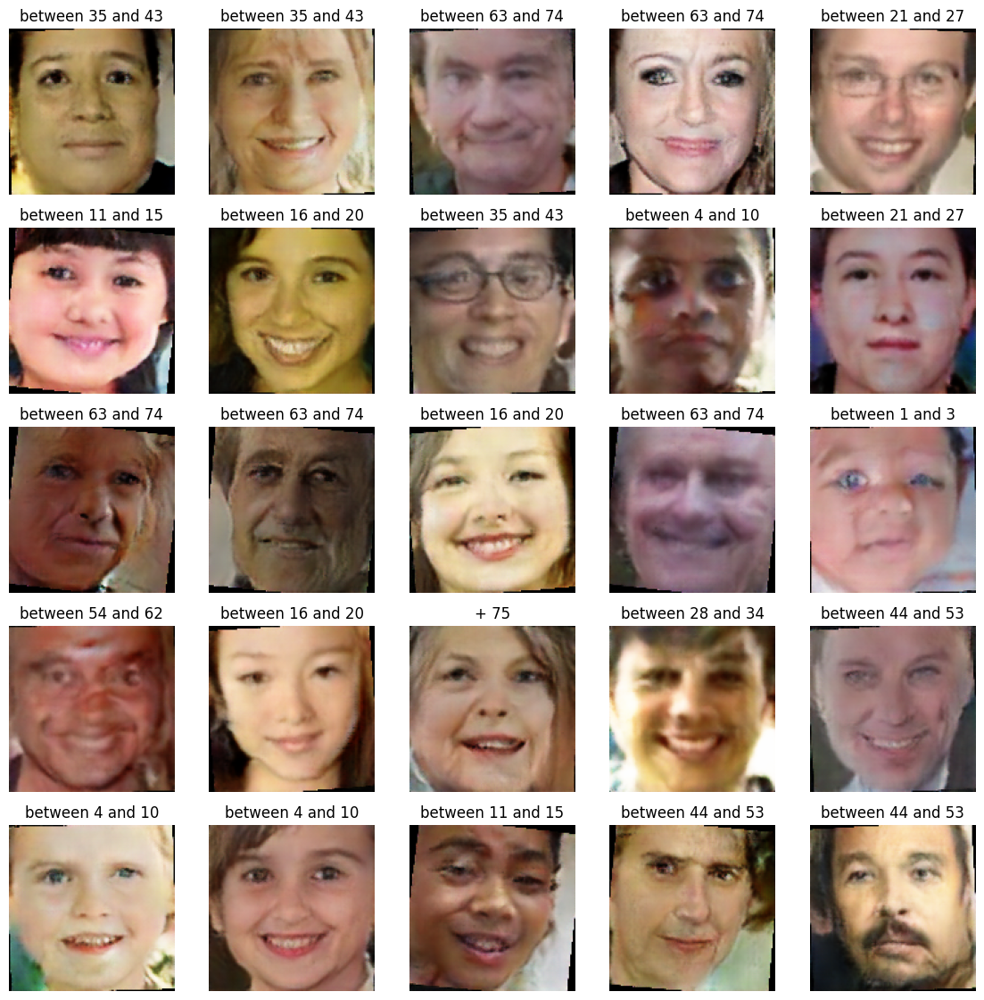

In [25]:
def sample_images1(generator, grid_rows=5, grid_cols=5):
    z = torch.randn(grid_rows * grid_cols, z_dim).to(device)

    age_cate = torch.randint(0, 11, (grid_rows * grid_cols,)).to(device) 
    
    gen_imgs = generator(z, age_cate).detach().cpu()
    gen_imgs = 0.5 * gen_imgs + 0.5
    print(gen_imgs[0].shape)

    fig, axs = plt.subplots(grid_rows, grid_cols, figsize=(14, 14), sharey=True, sharex=True)
    cnt = 0
    for i in range(grid_rows):
        for j in range(grid_cols):
            
            if age_cate[cnt] == 0:
                age = "between 1 and 3"
            elif age_cate[cnt] == 1:
                age = "between 4 and 10"
            elif age_cate[cnt] == 2:
                age = "between 11 and 15"
            elif age_cate[cnt] == 3:
                age = "between 16 and 20"
            elif age_cate[cnt] == 4:
                age = "between 21 and 27"
            elif age_cate[cnt] == 5:
                age = "between 28 and 34"
            elif age_cate[cnt] == 6:
                age = "between 35 and 43"
            elif age_cate[cnt] == 7:
                age = "between 44 and 53"
            elif age_cate[cnt] == 8:
                age = "between 54 and 62"
            elif age_cate[cnt] == 9:
                age = "between 63 and 74"
            else:
                age = "+ 75"
            axs[i, j].imshow(gen_imgs[cnt].permute(1, 2, 0))  
            axs[i, j].set_title(age)
            axs[i, j].axis('off')
            cnt += 1
    plt.show
generator.eval()
with torch.no_grad():
    sample_images1(generator)

In [21]:
generator.load_state_dict(torch.load("/kaggle/input/cgan/pytorch/default/1/generator-128-bce.pth", weights_only=True,map_location=torch.device(device)))
discriminator.load_state_dict(torch.load("/kaggle/input/cgan/pytorch/default/1/discriminator-128-bce.pth", weights_only=True,map_location=torch.device(device)))

<All keys matched successfully>

In [26]:
class EncBlock(nn.Module):
    def __init__(self, in_ch, out_ch, add_conv=False):
        super(EncBlock, self).__init__()

        layers = [
            nn.Conv2d(in_ch, out_ch, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(0.2, inplace=True),
        ]

        if add_conv:
            layers.extend([
                nn.Conv2d(out_ch, out_ch, kernel_size=3, stride=1, padding=1, bias=False),
                nn.BatchNorm2d(out_ch),
                nn.LeakyReLU(0.2, inplace=True),
            ])

        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)

In [27]:
class Encoder(nn.Module):
    def __init__(self, z_dim=128):
        super(Encoder, self).__init__()

        self.model = nn.Sequential(
            EncBlock(3, 32, add_conv=False),

            EncBlock(32, 64, add_conv=True),

            EncBlock(64, 128, add_conv=True),

            EncBlock(128, 256, add_conv=False),

            EncBlock(256, 128, add_conv=False),
        )
        
        self.fc1 = nn.Linear(128 * 4 * 4, 512)
        self.act = nn.LeakyReLU(0.2, inplace=True)
        self.fc2 = nn.Linear(512, z_dim)
        

    def forward(self, x):
        h = self.model(x)            
        h = h.view(h.size(0), -1)      
        h = self.fc1(h) 
        h = self.act(h)
        z = self.fc2(h)
        return z


In [ ]:
def generate_dataset(generator, num_samples=30000, batch_size=64):
    generator.eval()
    all_imgs = []
    all_latents = []

    with torch.no_grad():
        for i in range(0, num_samples, batch_size):
            z = torch.randn(batch_size, z_dim).to(device)
            age = torch.randint(0, 11, (batch_size,)).to(device)

            imgs = generator(z, age)

            all_latents.append(z.cpu())
            all_imgs.append(imgs.cpu())

    return torch.cat(all_imgs), torch.cat(all_latents)


In [ ]:
all_imgs, all_latents = generate_dataset(generator)

In [28]:
class ImageDatasetEncoder(Dataset):
    def __init__(self, all_imgs, all_latents):
        self.all_imgs = all_imgs
        self.all_latents = all_latents

    def __len__(self):
        return len(self.all_imgs)

    def __getitem__(self, idx):
        image = all_imgs[idx]
        latent = all_latents[idx]

        return {'image': image, 'latent':latent}

In [30]:
dataset = ImageDatasetEncoder(all_imgs, all_latents)
batch_size = 64
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [31]:
encoder = Encoder().to(device)
if num_gpus > 1:
    encoder = nn.DataParallel(encoder)

optimizer_E = optim.Adam(encoder.parameters(), lr=0.0002, betas=(0.5, 0.999))

criterion = nn.MSELoss()

In [32]:

print("\n=== ENCODER DETAILED SUMMARY ===")
summary(
    encoder,
    input_size=[(1, 3, 128, 128)],  # [img, age]
    dtypes=[torch.float32],
    device=device,
    col_names=["input_size", "output_size", "num_params", "kernel_size", "mult_adds"],
    verbose=1
)


=== ENCODER DETAILED SUMMARY ===
Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Kernel Shape              Mult-Adds
Encoder                                  [1, 3, 128, 128]          [1, 128]                  --                        --                        --
├─Sequential: 1-1                        [1, 3, 128, 128]          [1, 128, 4, 4]            --                        --                        --
│    └─EncBlock: 2-1                     [1, 3, 128, 128]          [1, 32, 64, 64]           --                        --                        --
│    │    └─Sequential: 3-1              [1, 3, 128, 128]          [1, 32, 64, 64]           1,600                     --                        6,291,520
│    └─EncBlock: 2-2                     [1, 32, 64, 64]           [1, 64, 32, 32]           --                        --                        --
│    │    └─Sequential: 3-2              [1, 32, 64, 64]        

Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Kernel Shape              Mult-Adds
Encoder                                  [1, 3, 128, 128]          [1, 128]                  --                        --                        --
├─Sequential: 1-1                        [1, 3, 128, 128]          [1, 128, 4, 4]            --                        --                        --
│    └─EncBlock: 2-1                     [1, 3, 128, 128]          [1, 32, 64, 64]           --                        --                        --
│    │    └─Sequential: 3-1              [1, 3, 128, 128]          [1, 32, 64, 64]           1,600                     --                        6,291,520
│    └─EncBlock: 2-2                     [1, 32, 64, 64]           [1, 64, 32, 32]           --                        --                        --
│    │    └─Sequential: 3-2              [1, 32, 64, 64]           [1, 64, 32, 32]           69,88

In [ ]:
def train_encoder(num_epochs):
    encoder.train()

    for epoch in range(num_epochs):
        epoch_loss = 0.0

        for batch in dataloader:
            imgs = batch['image'].to(device)        
            latents = batch['latent'].to(device)   

            optimizer_E.zero_grad()
            z_recon = encoder(imgs)
            loss = criterion(z_recon, latents)
            loss.backward()
            optimizer_E.step()
            epoch_loss += loss.item()

        if epoch % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}] | Loss: {epoch_loss/len(dataloader):.4f}")


In [ ]:
train_encoder(200)

In [ ]:
def invert_image_hybrid(generator, encoder, target_img_tensor, age_tensor,
                         z_dim=128, steps=200, lr=0.01):

    generator.eval()
    encoder.eval()
    target = target_img_tensor.to(device)
    with torch.no_grad():
        z_init = encoder(target).detach()
    z = z_init.clone().detach().to(device).requires_grad_(True)
    optimizer = torch.optim.Adam([z], lr=lr)
    criterion = torch.nn.L1Loss()
    for i in range(steps):
        optimizer.zero_grad()
        gen_img = generator(z, age_tensor)
        loss = criterion(gen_img, target)
        loss.backward()
        optimizer.step()
    return z.detach().cpu()


In [ ]:
from tqdm import tqdm

def build_inversion_dataset_hybrid(base_dir, out_dir, generator, encoder, real_img_paths, ages_list,
                                   z_dim=128, steps=200, lr=0.01):
    os.makedirs(out_dir, exist_ok=True)
    transform_real = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3)
    ])

    for i, img_path in enumerate(tqdm(real_img_paths)):
        img = Image.open(base_dir + img_path).convert("RGB")
        img_t = transform_real(img).unsqueeze(0).to(device)

        age_val = ages_list[i]
        age_tensor = torch.tensor([age_val], dtype=torch.long, device=device)
        z_star = invert_image_hybrid(
            generator, encoder, img_t, age_tensor,
            z_dim=z_dim, steps=steps, lr=lr
        )
        base = os.path.splitext(os.path.basename(img_path))[0]
        torch.save(
            {"img_path": img_path, "age": age_val, "z_star": z_star}, f"{out_dir}/{base}.pt"
        )


In [ ]:
class InvertedDataset(Dataset):
    def __init__(self, files):
        self.files = files
        self.transform = transforms.Compose([
            transforms.Resize((128, 128)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        data = torch.load(self.files[idx])
        imm = "/kaggle/input/utkface-new/" + data["img_path"]
        img = Image.open(imm).convert("RGB")
        img_t = self.transform(img)

        z_star = data["z_star"].squeeze(0)
        age = torch.tensor([data["age"]], dtype=torch.long)

        return {
            "image": img_t,
            "z": z_star,
            "age": age
        }


In [ ]:
def train_encoder_from_inversions(encoder, loader, epochs=20, lr=1e-4):
    encoder.train()
    optimizer = torch.optim.Adam(encoder.parameters(), lr=lr)
    criterion = nn.MSELoss()
    for ep in range(epochs):
        total = 0
        for batch in loader:
            imgs = batch["image"].to(device)
            z_star = batch["z"].to(device)
            optimizer.zero_grad()
            z_pred = encoder(imgs)
            loss = criterion(z_pred, z_star)

            loss.backward()
            optimizer.step()

            total += loss.item() * imgs.size(0)

        print(f"Epoch {ep+1}/{epochs} — Loss: {total / len(loader.dataset):.6f}")


In [ ]:
ages_list = []
for filename in images_crop:
    age = int(filename.split('/')[1].split('_')[0])
    if age <= 3:
        ages_list.append(0)
    elif 4 <= age <= 10:
        ages_list.append(1)
    elif 11 <= age <= 15:
        ages_list.append(2)
    elif 16 <= age <= 20:
        ages_list.append(3)
    elif 21 <= age <= 27:
        ages_list.append(4)
    elif 28 <= age <= 34:
        ages_list.append(5)
    elif 35 <= age <= 43:
        ages_list.append(6)
    elif 44 <= age <= 53:
        ages_list.append(7)
    elif 54 <= age <= 62:
        ages_list.append(8)
    elif 63 <= age <= 74:
        ages_list.append(9)
    else:
        ages_list.append(10)

In [ ]:
generator.to(device).eval()
encoder.to(device).eval()   
real_dir = "/kaggle/input/utkface-new/"
out_dir = "./inversions_hybrid"
build_inversion_dataset_hybrid(real_dir, out_dir, 
    generator, encoder,
    images_crop, ages_list,
    steps=200,
    lr=0.01
)

In [ ]:
import glob
inv_files = sorted(glob.glob(out_dir + "/*.pt"))
dataset = InvertedDataset(inv_files)
loader = DataLoader(dataset, batch_size=64, shuffle=True, num_workers=2)

In [ ]:
train_encoder_from_inversions(encoder, loader, epochs=100, lr=1e-4)

In [ ]:
torch.save(encoder.state_dict(), "encoder2-128-bce.pth")

In [36]:
encoder.load_state_dict(torch.load("/kaggle/input/cgan/pytorch/default/1/encoder2-128-bce.pth", weights_only=True,map_location=torch.device(device)))

<All keys matched successfully>

In [33]:
transform_real = transforms.Compose([
    transforms.Resize((128, 128)),  
    transforms.ToTensor(),          
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # image -> [-1,1]
])

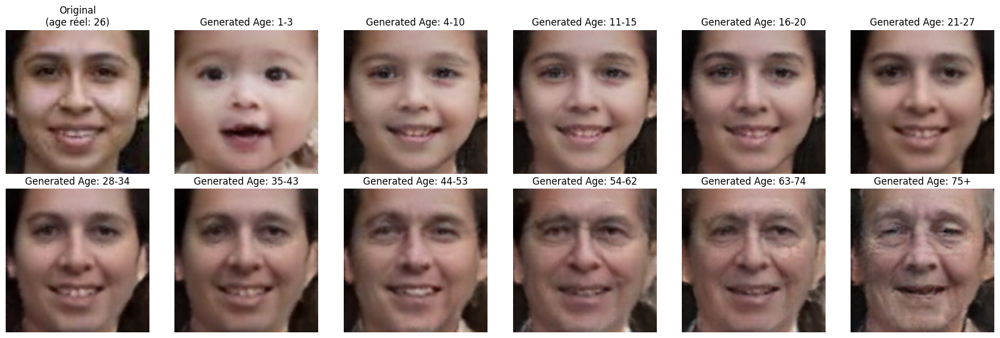

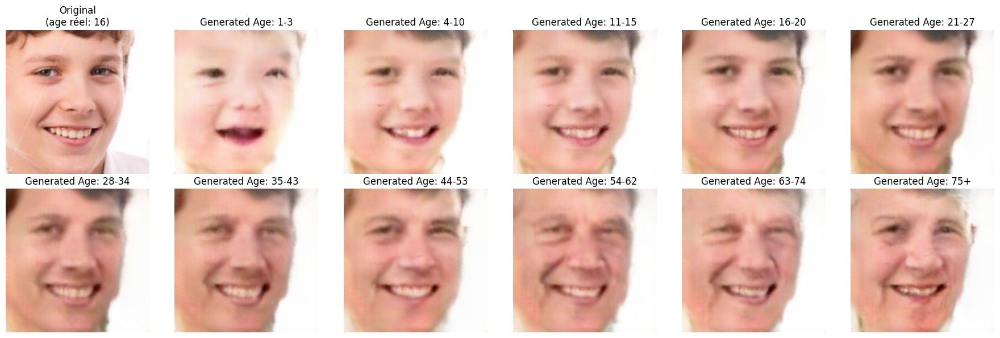

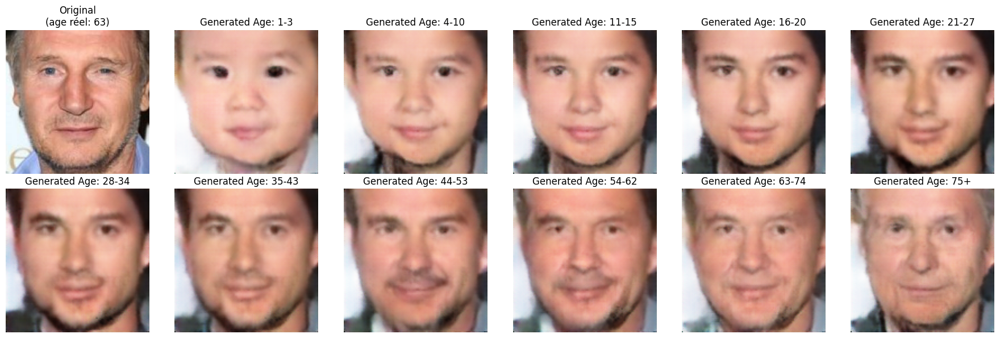

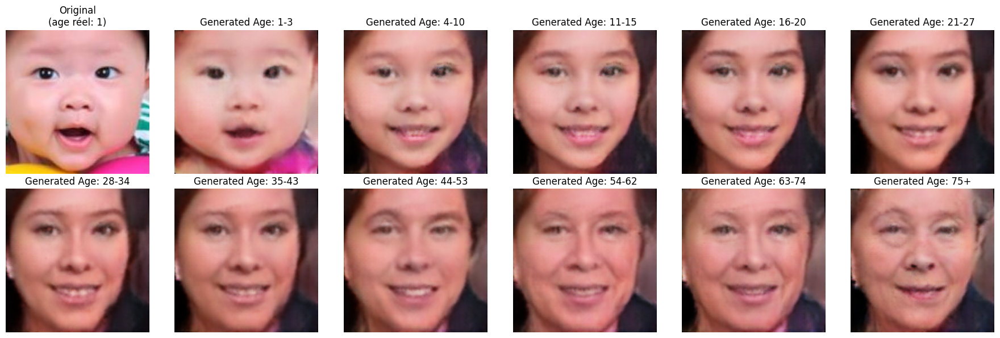

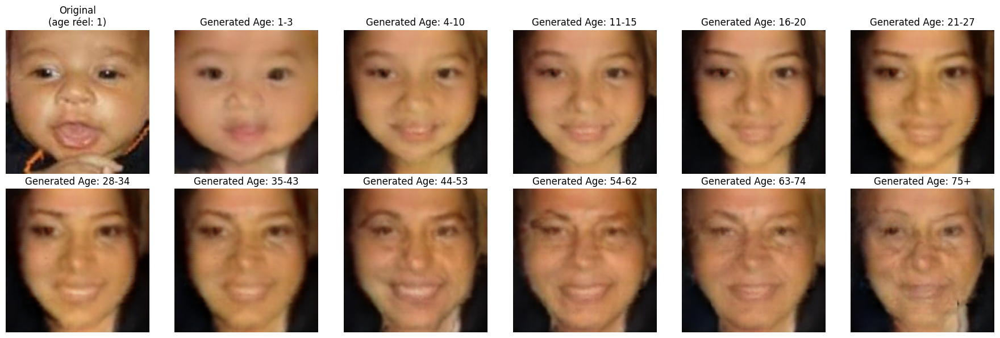

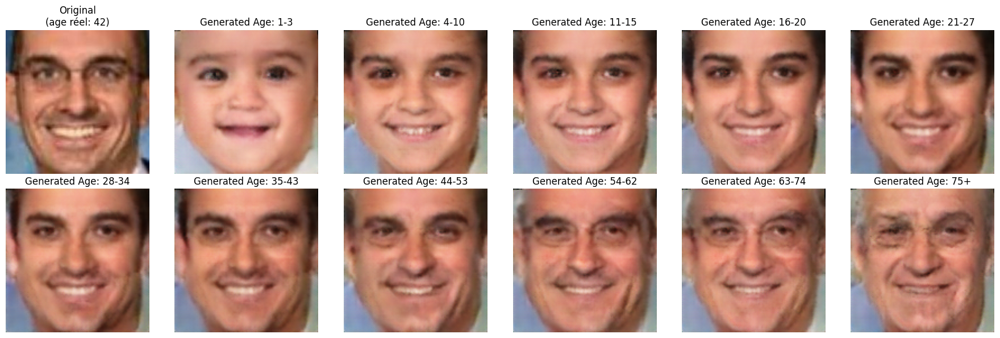

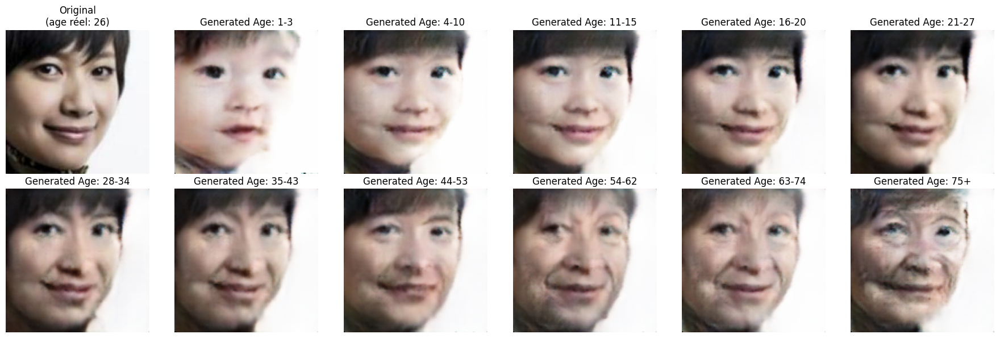

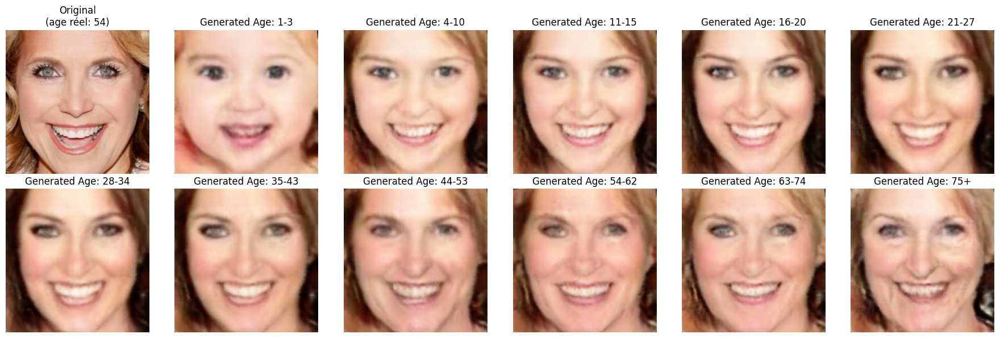

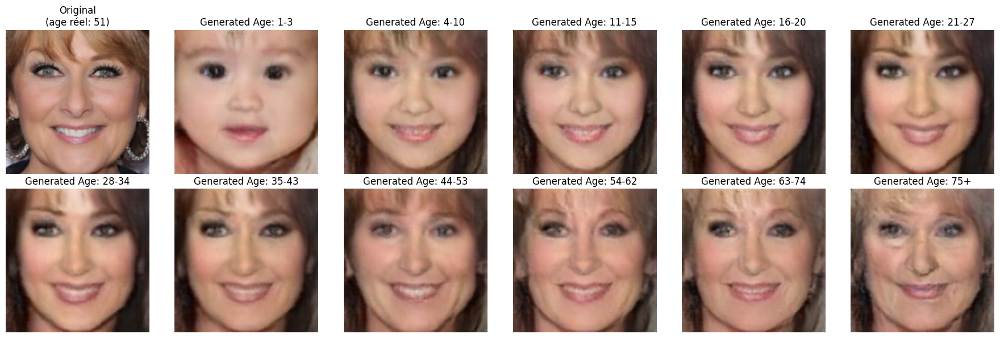

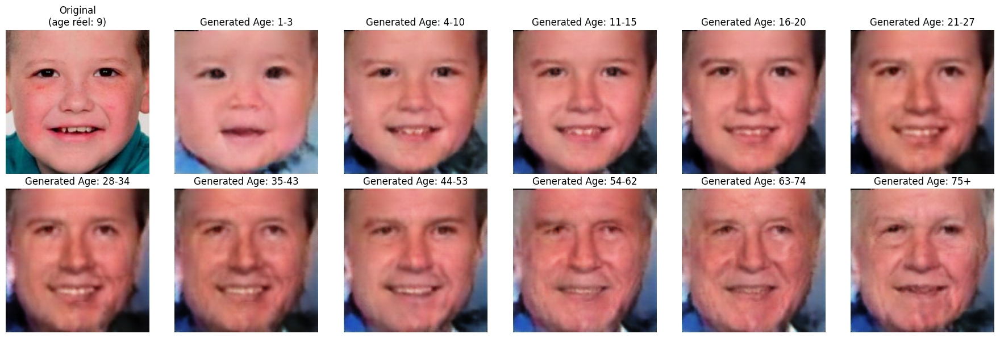

In [38]:
generator.eval()
encoder.eval()
idxs = [103,104,105,109,200,202,211,2018,3004,3007]
images_crop = os.listdir('/kaggle/input/utkface-new/crop_part1')
for idx in idxs:
    im_file = f'/kaggle/input/utkface-new/crop_part1/{images_crop[idx]}'
    real_img = Image.open(im_file)
    age_real = int(im_file.split('/')[5].split('_')[0])
    real_im = transform_real(real_img).unsqueeze(0).to(device)
    # ages_text = ["between 1 and 3", "between 4 and 10", "between 11 and 15", "between 16 and 20", "between 21 and 27",
    #        "between 28 and 34", "between 35 and 43", "between 44 and 53", "between 54 and 62", "between 63 and 74",
    #        "+ 75"]
    ages_text = [
        "1-3", "4-10", "11-15", "16-20", "21-27",
        "28-34", "35-43", "44-53", "54-62", "63-74",
        "75+"
    ]
    
    with torch.no_grad():
        ages = torch.arange(0, 11).to(device)
        z_enc = encoder(real_im)
        z_batch = z_enc.repeat(len(ages), 1)
        imgs = generator(z_batch, ages)
        imgs = imgs.cpu() * 0.5 + 0.5
    
        fig, axs = plt.subplots(2, 6, figsize=(18, 6))
    
        #  image originale 
        axs[0, 0].imshow(real_img)
        axs[0, 0].set_title(f"Original\n(age réel: {age_real})")
        axs[0, 0].axis('off')
    
        # images générées 
        idx = 0
        for r in range(2):
            for c in range(6):
                if r == 0 and c == 0:
                    continue  
                if idx >= 11:
                    axs[r, c].axis('off')
                    continue
    
                axs[r, c].imshow(imgs[idx].permute(1, 2, 0))
                axs[r, c].set_title(f"Generated Age: {ages_text[idx]}")
                axs[r, c].axis('off')
                idx += 1
    
        plt.tight_layout()
        plt.show()
